<a href="https://colab.research.google.com/github/inc0878/Xray/blob/main/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np, pandas as pd
from glob import glob

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')


In [ ]:
df = pd.read_csv('D:/materi/semester6/data_mining/Xray/Data_Entry_2017.csv')
df_info = df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112120 entries, 0 to 112119
Data columns (total 12 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Image Index                  112120 non-null  object 
 1   Finding Labels               112120 non-null  object 
 2   Follow-up #                  112120 non-null  int64  
 3   Patient ID                   112120 non-null  int64  
 4   Patient Age                  112120 non-null  int64  
 5   Patient Gender               112120 non-null  object 
 6   View Position                112120 non-null  object 
 7   OriginalImage[Width          112120 non-null  int64  
 8   Height]                      112120 non-null  int64  
 9   OriginalImagePixelSpacing[x  112120 non-null  float64
 10  y]                           112120 non-null  float64
 11  Unnamed: 11                  0 non-null       float64
dtypes: float64(3), int64(5), object(4)
memory usage: 10.3+ MB


In [ ]:
df.drop(columns=['Unnamed: 11'],inplace=True)
print(f'Shape of DataFrame: {df.shape}')
df.head()

Shape of DataFrame: (112120, 11)


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y]
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143


In [ ]:
df.describe(include='all')

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y]
count,112120,112120,112120.000000,112120.000000,112120.000000,112120,112120,112120.000000,112120.000000,112120.000000,112120.000000
unique,112120,836,NaN,NaN,NaN,2,2,NaN,NaN,NaN,NaN
top,00000001_000.png,No Finding,NaN,NaN,NaN,M,PA,NaN,NaN,NaN,NaN
freq,1,60361,NaN,NaN,NaN,63340,67310,NaN,NaN,NaN,NaN
mean,NaN,NaN,8.573751,14346.381743,46.901463,NaN,NaN,2646.078844,2486.438842,0.155649,0.155649
std,NaN,NaN,15.406320,8403.876972,16.839923,NaN,NaN,341.246429,401.268227,0.016174,0.016174
min,NaN,NaN,0.000000,1.000000,1.000000,NaN,NaN,1143.000000,966.000000,0.115000,0.115000
25%,NaN,NaN,0.000000,7310.750000,35.000000,NaN,NaN,2500.000000,2048.000000,0.143000,0.143000
50%,NaN,NaN,3.000000,13993.000000,49.000000,NaN,NaN,2518.000000,2544.000000,0.143000,0.143000
75%,NaN,NaN,10.000000,20673.000000,59.000000,NaN,NaN,2992.000000,2991.000000,0.168000,0.168000


In [ ]:
categorical_columns = df.select_dtypes(include=['category','object']).columns
print(categorical_columns)
numerical_columns = df.select_dtypes(include=['int64','float64']).columns

Index(['Image Index', 'Finding Labels', 'Patient Gender', 'View Position'], dtype='object')


In [ ]:
df[numerical_columns].describe()

,Follow-up #,Patient ID,Patient Age,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y]
count,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000
mean,8.573751,14346.381743,46.901463,2646.078844,2486.438842,0.155649,0.155649
std,15.406320,8403.876972,16.839923,341.246429,401.268227,0.016174,0.016174
min,0.000000,1.000000,1.000000,1143.000000,966.000000,0.115000,0.115000
25%,0.000000,7310.750000,35.000000,2500.000000,2048.000000,0.143000,0.143000
50%,3.000000,13993.000000,49.000000,2518.000000,2544.000000,0.143000,0.143000
75%,10.000000,20673.000000,59.000000,2992.000000,2991.000000,0.168000,0.168000
max,183.000000,30805.000000,414.000000,3827.000000,4715.000000,0.198800,0.198800


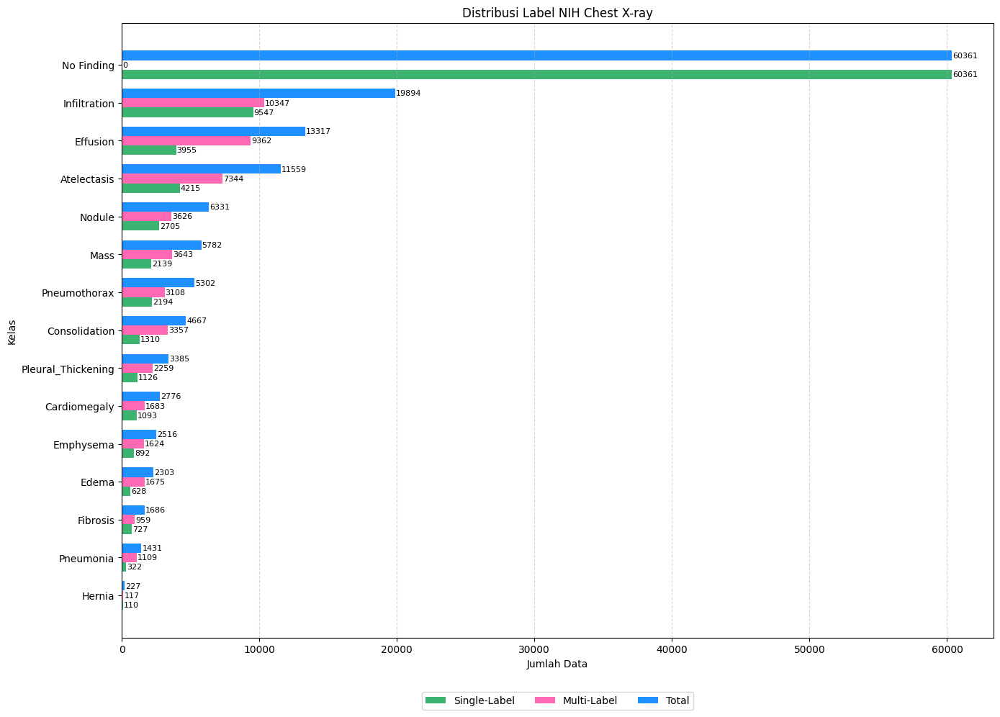

In [ ]:
# Split label ke dalam list
df['Finding Labels'] = df['Finding Labels'].str.split('|')
df['Finding Labels'] = df['Finding Labels'].apply(lambda x: [label.strip() for label in x])
df['num_labels'] = df['Finding Labels'].apply(len)

# Pisahkan single dan multi
single_disease = df[df['num_labels'] == 1]
multi_disease = df[df['num_labels'] > 1]

# Ambil semua label unik
all_labels = set(label for sublist in df['Finding Labels'] for label in sublist)

# Hitung distribusi label
data = []
for label in sorted(all_labels):
    s_count = single_disease['Finding Labels'].apply(lambda x: label in x).sum()
    m_count = multi_disease['Finding Labels'].apply(lambda x: label in x).sum()
    total = s_count + m_count
    data.append((label, s_count, m_count, total))

count_df = pd.DataFrame(data, columns=['Label', 'Single', 'Multi', 'Total']).sort_values('Total')

import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 10))
bar_width = 0.25
labels = count_df['Label']
x = np.arange(len(labels))

bars1 = plt.barh(x - bar_width, count_df['Single'], height=bar_width, color='mediumseagreen', label='Single-Label')
bars2 = plt.barh(x, count_df['Multi'], height=bar_width, color='hotpink', label='Multi-Label')
bars3 = plt.barh(x + bar_width, count_df['Total'], height=bar_width, color='dodgerblue', label='Total')

for bars in [bars1, bars2, bars3]:
    for bar in bars:
        width = bar.get_width()
        plt.text(width + 50, bar.get_y() + bar.get_height()/2, f'{int(width)}', va='center', fontsize=8)

plt.yticks(x, labels)
plt.xlabel('Jumlah Data')
plt.ylabel('Kelas')
plt.title('Distribusi Label NIH Chest X-ray')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.08), ncol=3)
plt.grid(True, axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


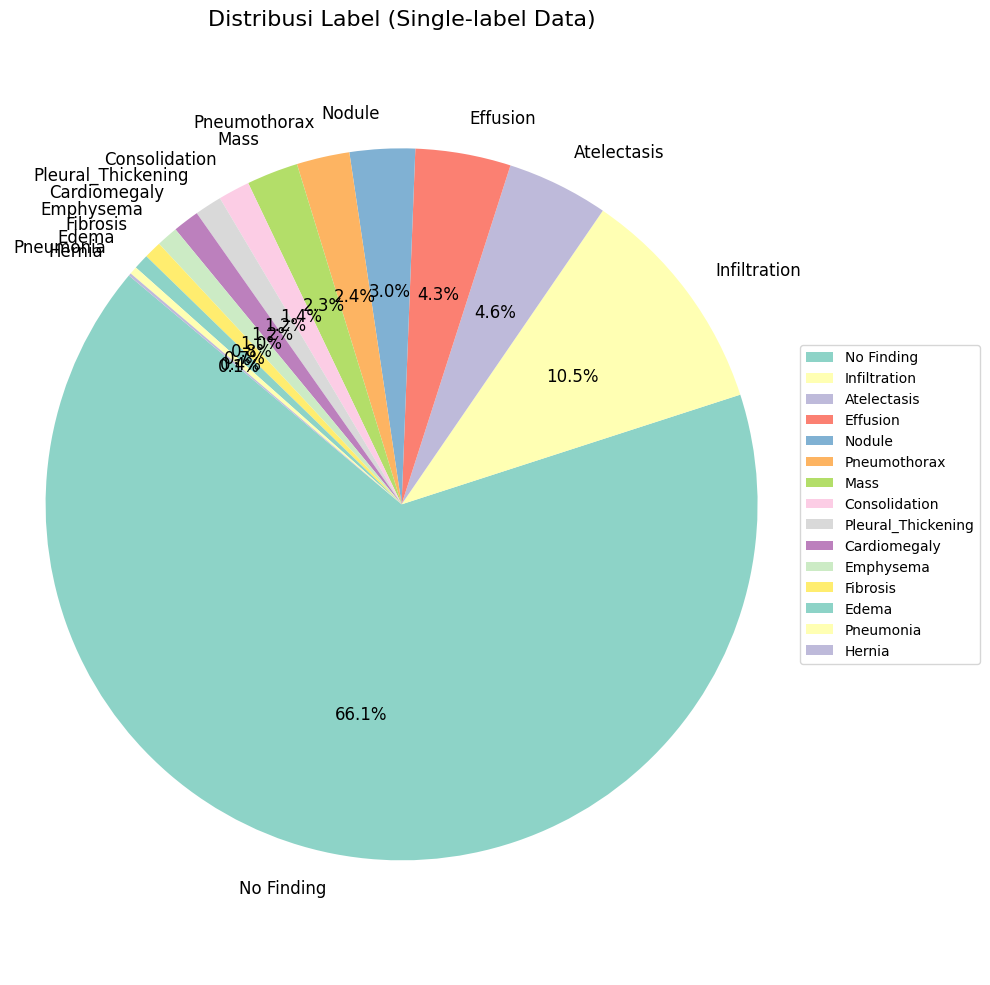

In [ ]:
import seaborn as sns

single_label_df = single_disease.copy()
label_counts = single_label_df['Finding Labels'].explode().value_counts()
top_labels = label_counts.head(15)
colors = sns.color_palette('Set3', n_colors=len(top_labels))

plt.figure(figsize=(10, 10))
plt.pie(top_labels,
        labels=top_labels.index,
        autopct='%.1f%%',
        startangle=140,
        colors=colors,
        textprops={'fontsize': 12})
plt.title("Distribusi Label (Single-label Data)", fontsize=16)
plt.axis('equal')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.tight_layout()
plt.show()


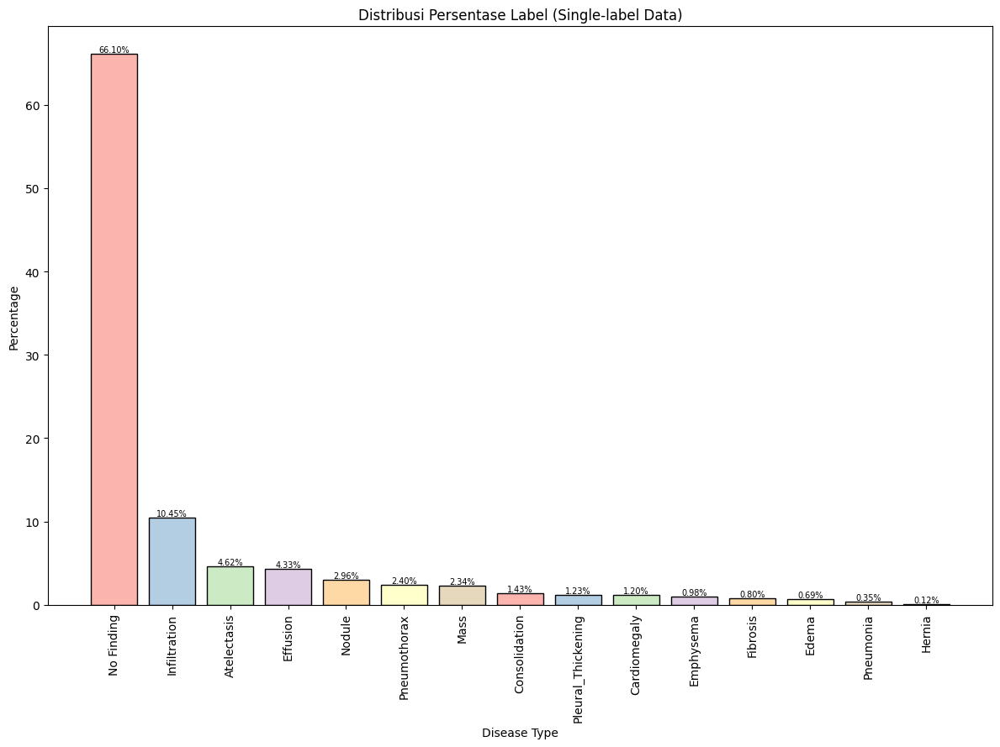

In [ ]:
from palettable.colorbrewer.qualitative import Pastel1_7

tmp = single_label_df['Finding Labels'].explode().value_counts()

plt.figure(figsize=(12, 9))
bars = plt.bar(tmp.index, tmp.values / tmp.values.sum() * 100, color=Pastel1_7.hex_colors, edgecolor='black')

for rect in bars:
    x = rect.get_x() + rect.get_width() / 2.0
    y = rect.get_height()
    plt.text(x, y, f'{y:.2f}%', ha='center', va='bottom', size=7)

plt.xlabel('Disease Type')
plt.ylabel('Percentage')
plt.xticks(rotation=90)
plt.title('Distribusi Persentase Label (Single-label Data)')
plt.tight_layout()
plt.show()


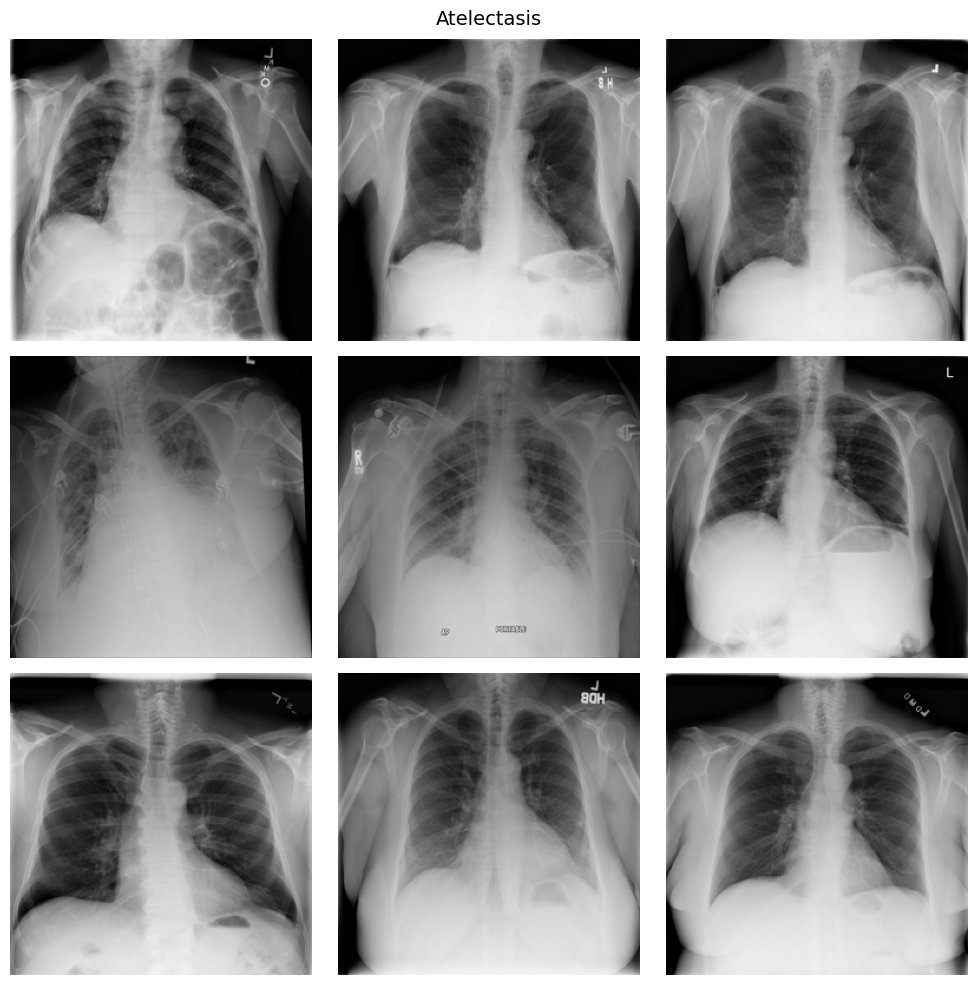

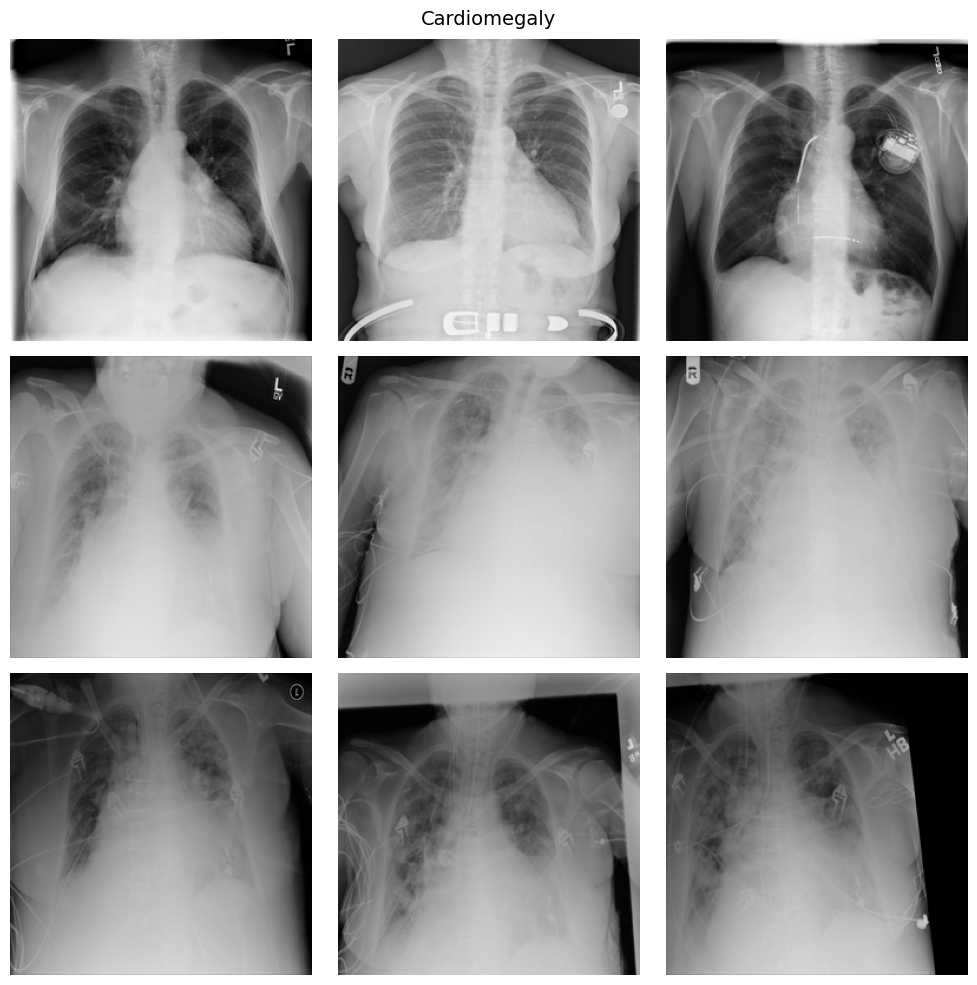

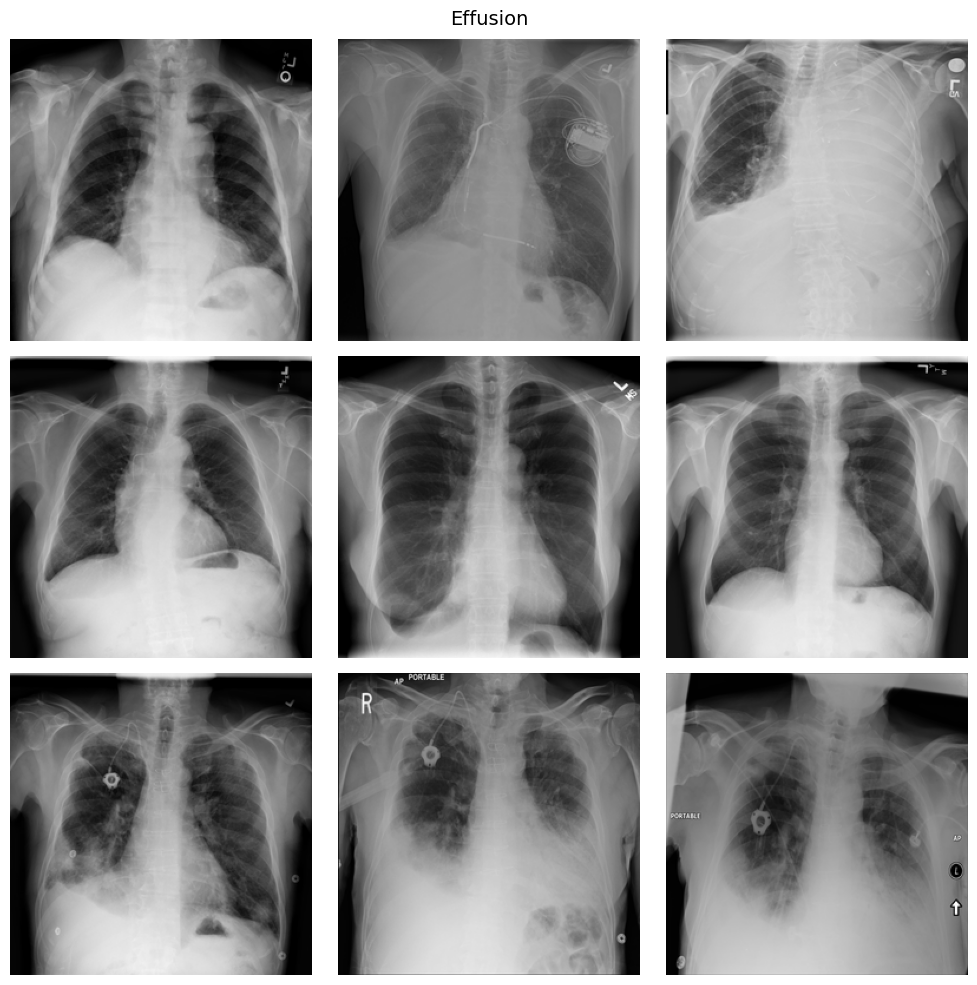

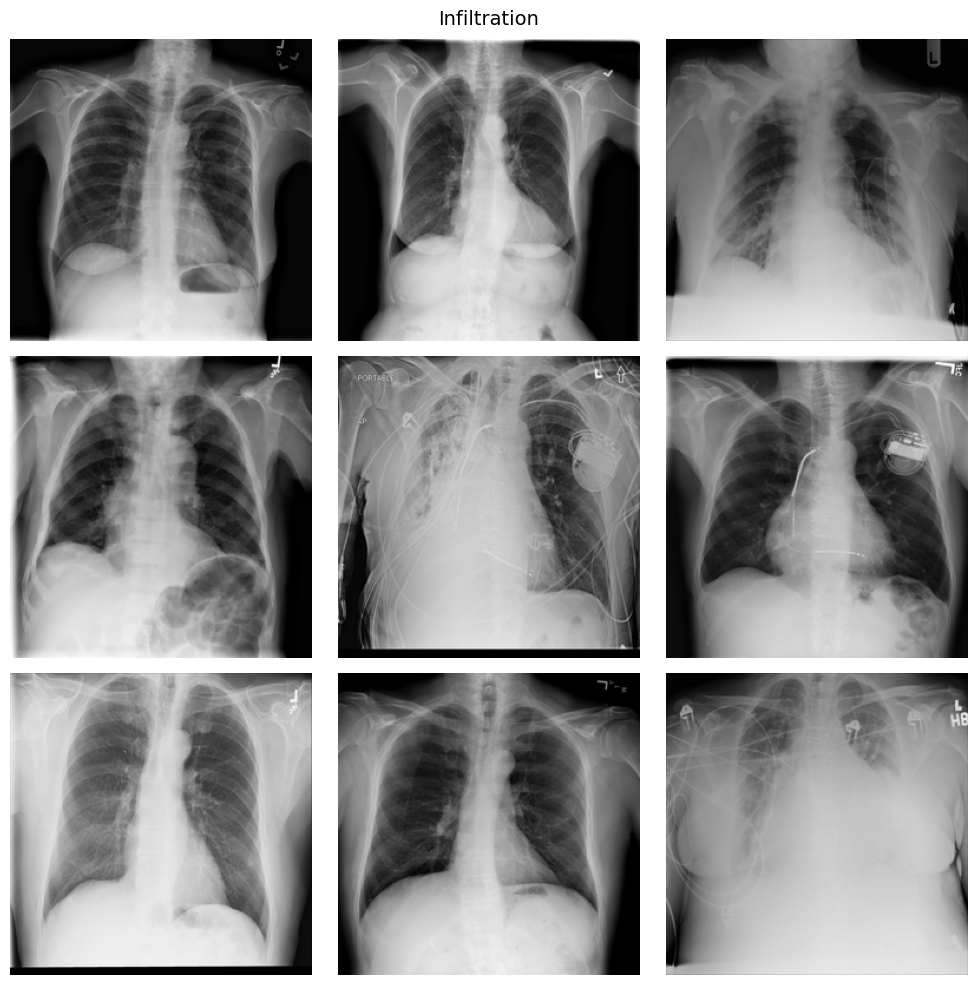

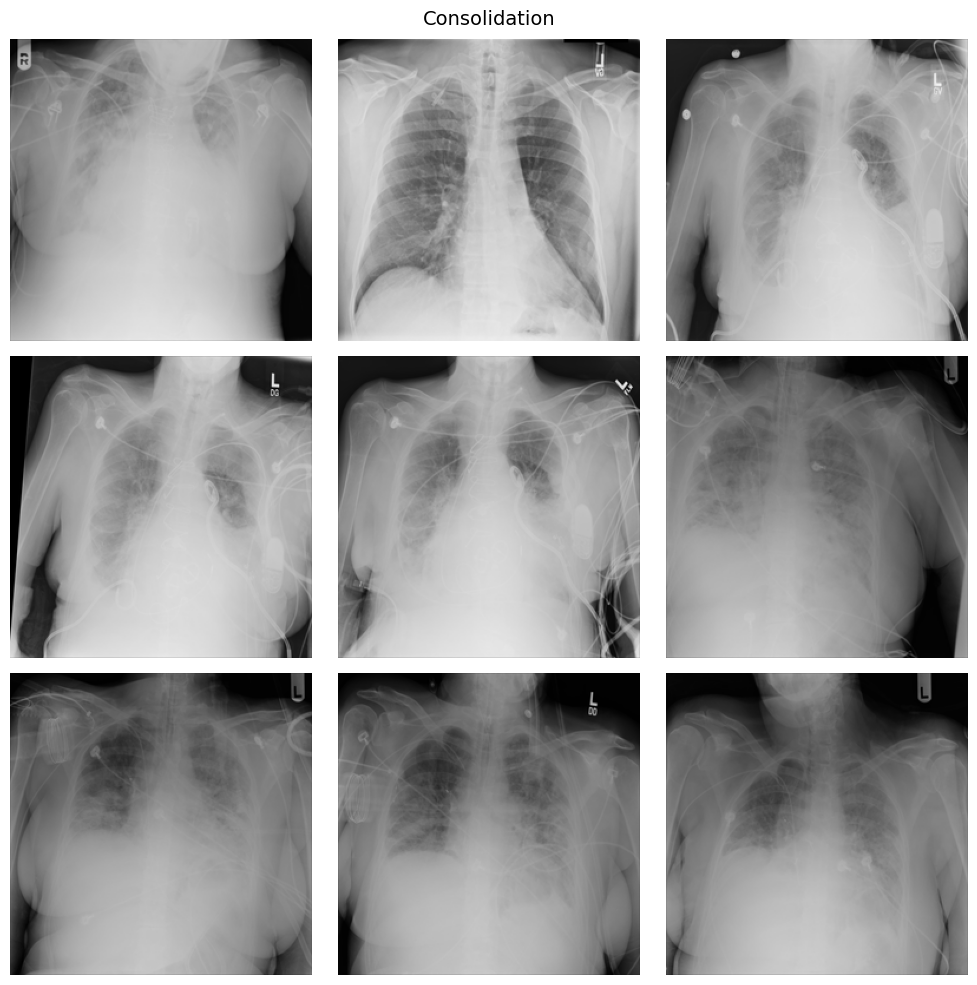

...

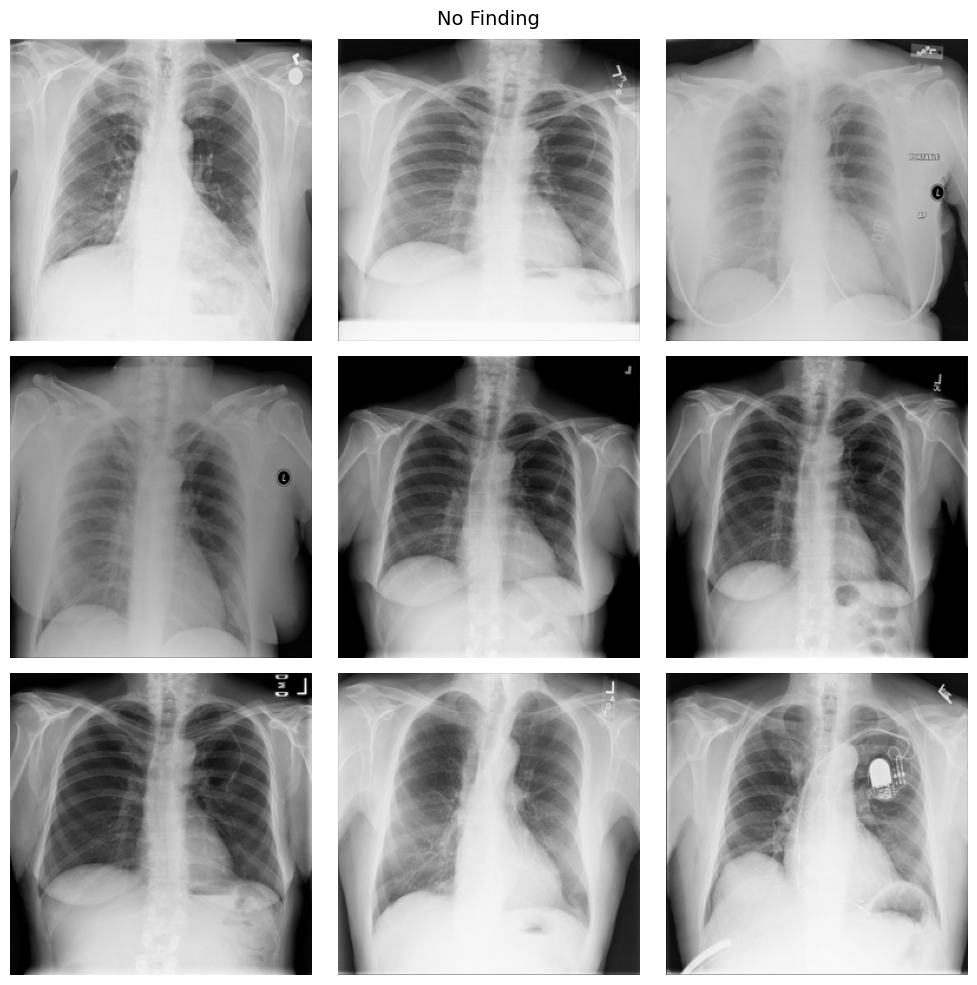

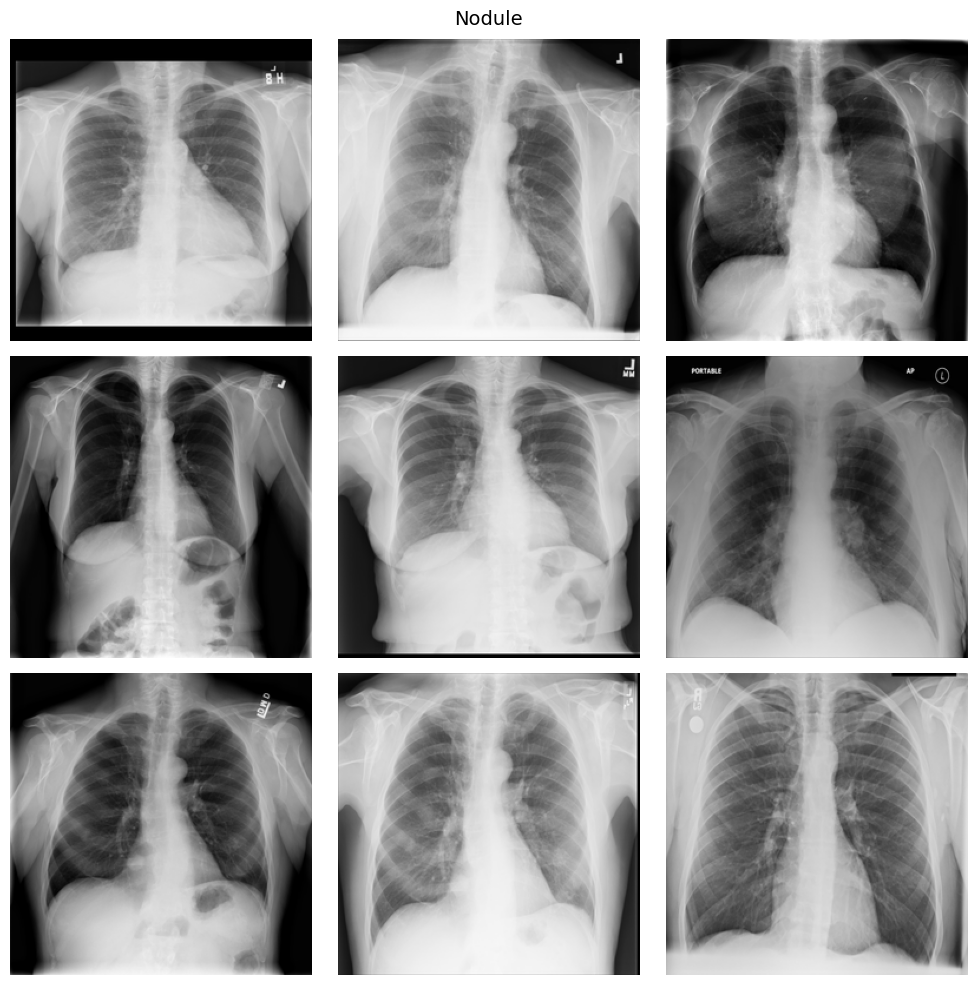

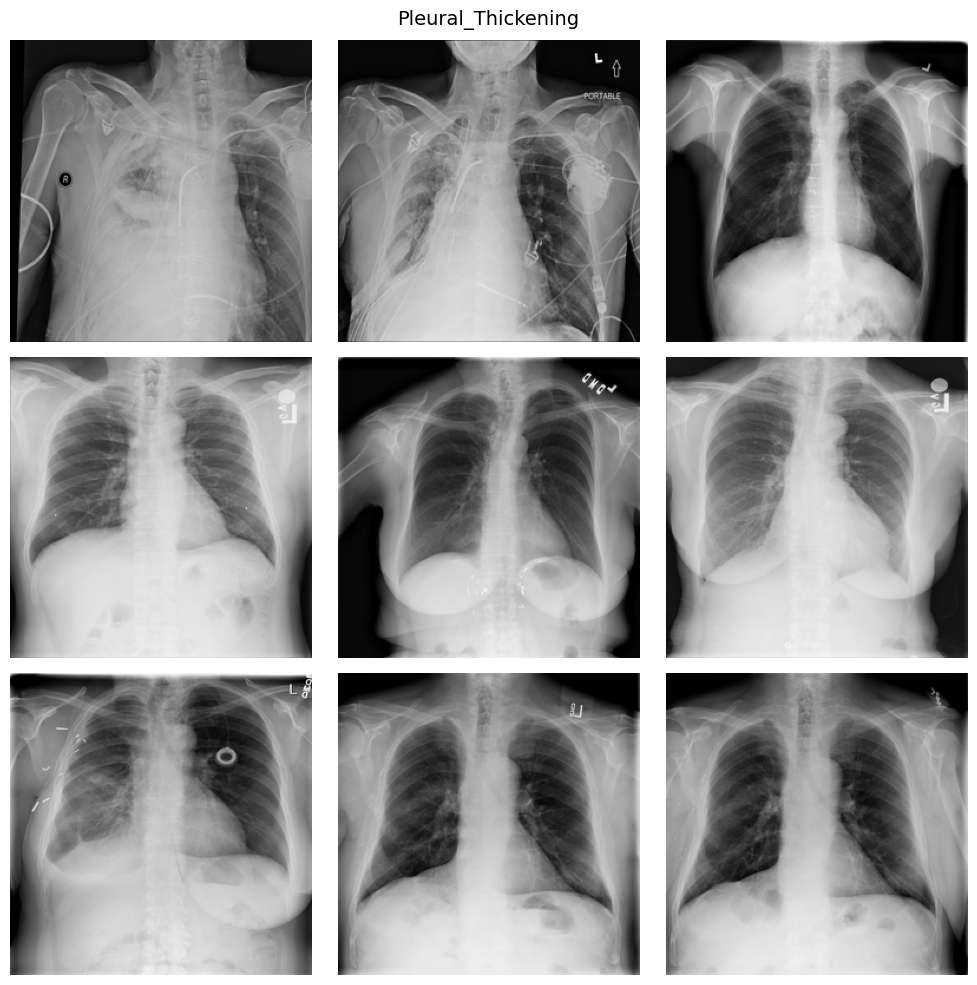

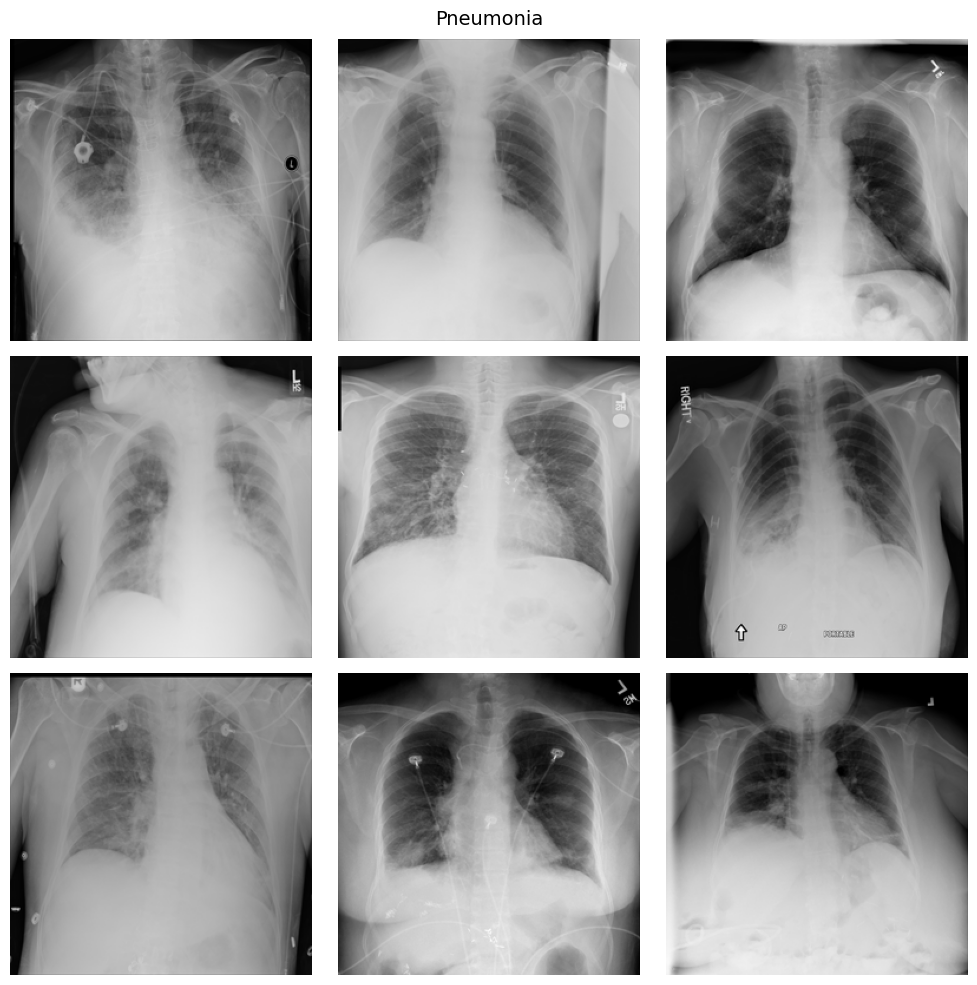

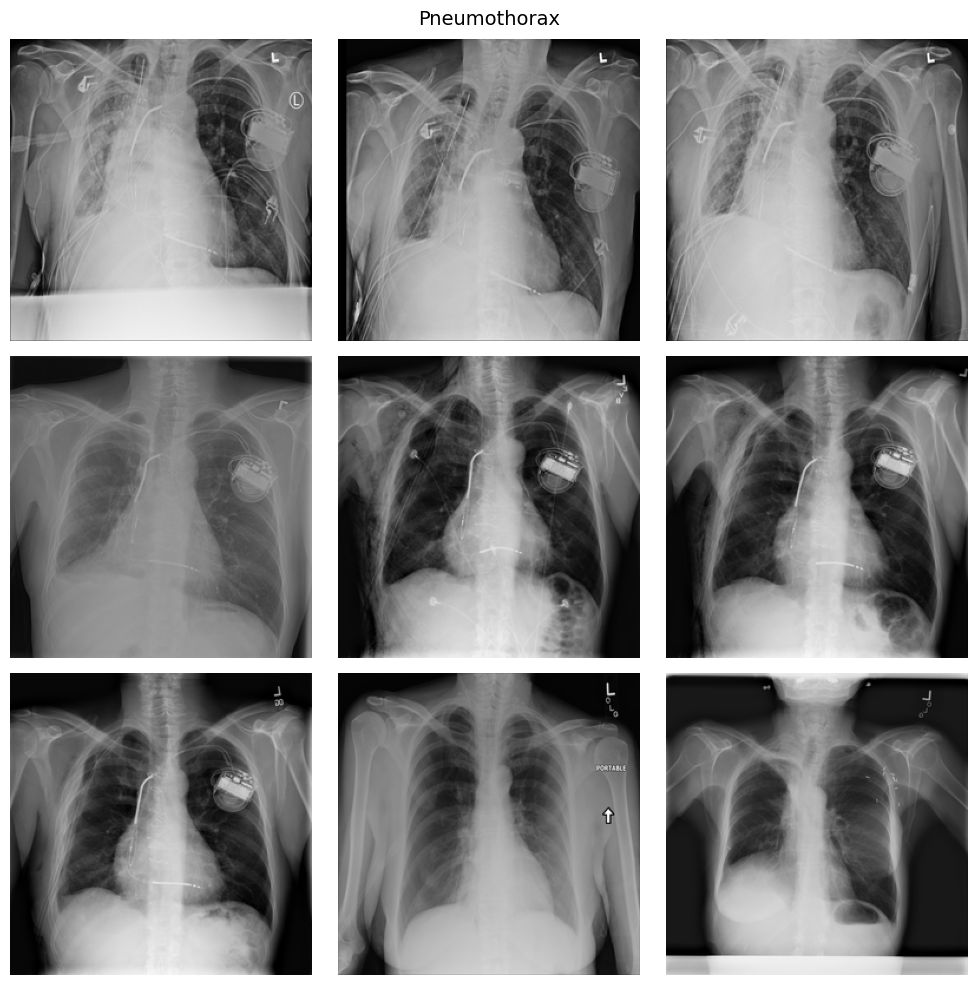

In [ ]:
from PIL import Image


csv_path = r'D:\materi\semester6\data_mining\Xray\Data_Entry_2017.csv'
df = pd.read_csv(csv_path)

# Filter hanya label tunggal (tidak mengandung "|")
single_label_df = df[~df['Finding Labels'].str.contains('\|')]

labels_to_show = ['Atelectasis', 'Cardiomegaly', 'Effusion', 'Infiltration','Consolidation', 'Edema', 'Emphysema', 'Fibrosis','Hernia', 'Mass', 'No Finding', 'Nodule','Pleural_Thickening', 'Pneumonia', 'Pneumothorax']

base_dir = r'D:\materi\semester6\data_mining\Xray\Dataset_berlabel'
n_images_per_label = 9  # jumlah gambar per label

for label in labels_to_show:
    subset = single_label_df[single_label_df['Finding Labels'] == label]
    selected_rows = subset.head(n_images_per_label).reset_index(drop=True)

    if len(selected_rows) < n_images_per_label:
        continue

    plt.figure(figsize=(10, 10))
    for i in range(n_images_per_label):
        plt.subplot(3, 3, i + 1)
        img_name = selected_rows.loc[i, 'Image Index']
        img_path = os.path.join(base_dir, label, img_name)
        try:
            img = Image.open(img_path).convert('RGB')
            img = img.resize((256, 256), Image.Resampling.LANCZOS)
            img = np.array(img)
            plt.imshow(img)
            plt.axis('off')
        except FileNotFoundError:
            print(f"Gambar tidak ditemukan: {img_path}")
            plt.axis('off')

    plt.suptitle(label, fontsize=14)
    plt.tight_layout()
    plt.show()


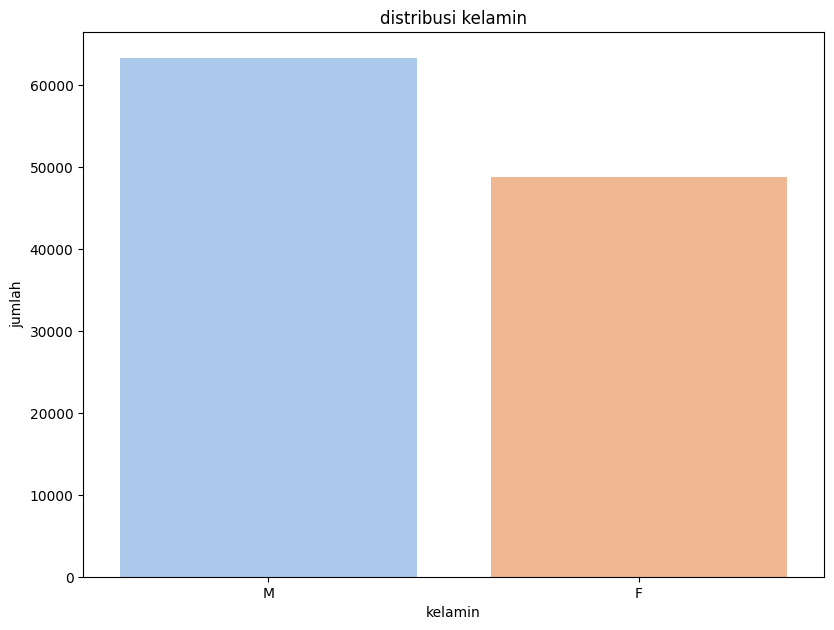

In [ ]:
gender_counts = df['Patient Gender'].value_counts()
plt.figure(figsize=(16, 12))

plt.subplot(2, 2, 2)
sns.barplot(x=gender_counts.index, y=gender_counts.values, palette="pastel")
plt.title("distribusi kelamin")
plt.xlabel("kelamin")
plt.ylabel("jumlah")
plt.tight_layout()
plt.show()

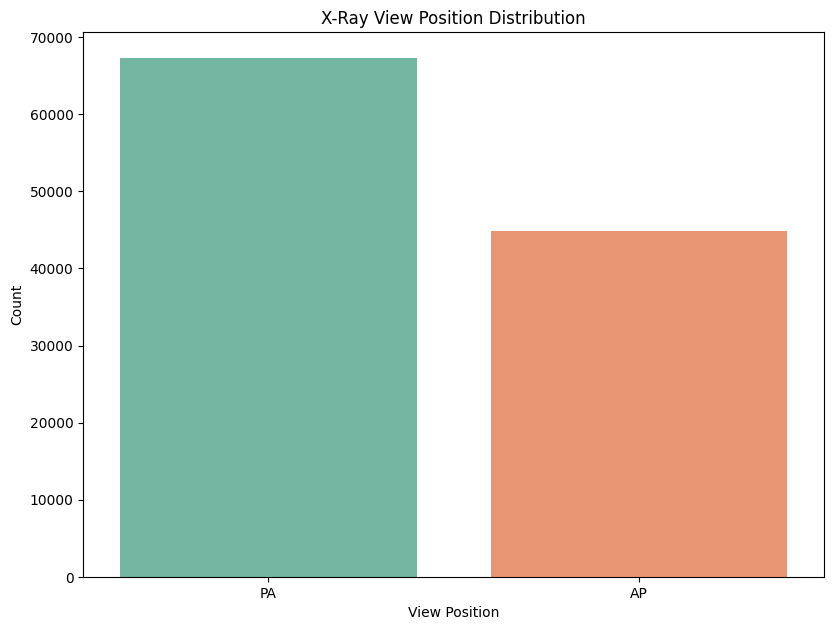

In [ ]:
view_position_counts = df['View Position'].value_counts()
plt.figure(figsize=(16, 12))

plt.subplot(2, 2, 3)
sns.barplot(x=view_position_counts.index, y=view_position_counts.values, palette="Set2")
plt.title("X-Ray View Position Distribution")
plt.xlabel("View Position")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

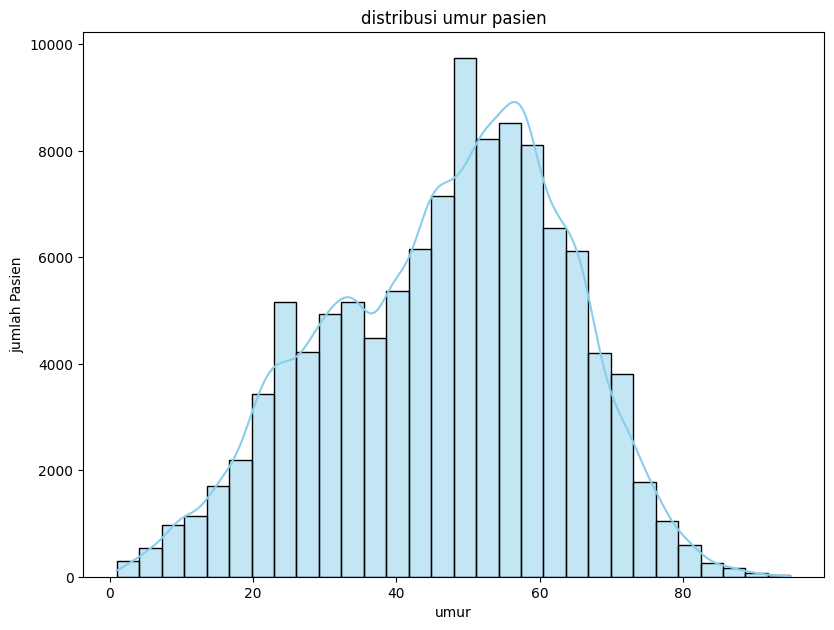

In [ ]:
age_filtered = df[df['Patient Age'] < 100]['Patient Age']
plt.figure(figsize=(16, 12))
plt.subplot(2, 2, 4)
sns.histplot(age_filtered, bins=30, kde=True, color='skyblue')
plt.title("distribusi umur pasien")
plt.xlabel("umur")
plt.ylabel("jumlah Pasien")

plt.tight_layout()
plt.show()